# Monophonic Audio Transcription

This notebook describes the process of reading and interpreting a simple music audio file to create the corresponding sheet music out of it.

This research was made during my computer science degree, I should mention my colleagues that worked with me on this: Gabriel Paulon and Lucas Antoniassi, and also our advisor Dr. Ivandro Sanches

This is meant to be a tutorial, a more organized and generic implementation is at this [Repository](https://github.com/kaiubiferreira/monophonic_audio_transcription)

The process consists of a few important feature extration steps:
- Reading the raw music file and metadata
- Onset Detection, which means detecting the start instant of each played note
- Pitch Detection, which is the process of finding the fundamental frequency of an audio sample, from which we can infer the note name and octave
- Tempo estimation, this is a value in BPM (Beats Per Minute) that tells how fast the music sheet should be played
    
After that we can start writing the music sheet using a standard XML notation [MusicXML](https://www.musicxml.com/)

## 1. Audio Metadata

In [1]:
# First let's import some python libraries
from scipy import signal
from scipy.io import wavfile
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pyreaper
import math

# Python notebook
import IPython.display as ipd
%matplotlib inline

In [2]:
# And then read the audio raw data using scipy wavfile module
file_name = 'pirates'
sampling_rate, waveform = wavfile.read('audio/{0}.wav'.format(file_name))

# Let's see the shape of this data
print("{0} Hz, wave shape: {1}".format(sampling_rate, waveform.shape))

44100 Hz, wave shape: (996864, 2)


This means our file was sampled with 44100 frames per second, has 996864 frames and is split in 2 channels

I'm only interested in monophonic sounds, so I'm going to merge these two channels into one

In [3]:
waveform = (waveform[:, 0] + waveform[:, 1])/2
waveform.shape

(996864,)

Ok, now we have a simple numpy array with 996864 entries

In [4]:
num_frames = len(waveform)
duration = num_frames / sampling_rate
duration

22.604625850340135

And our music has about 22.6 seconds, let's take a look at it

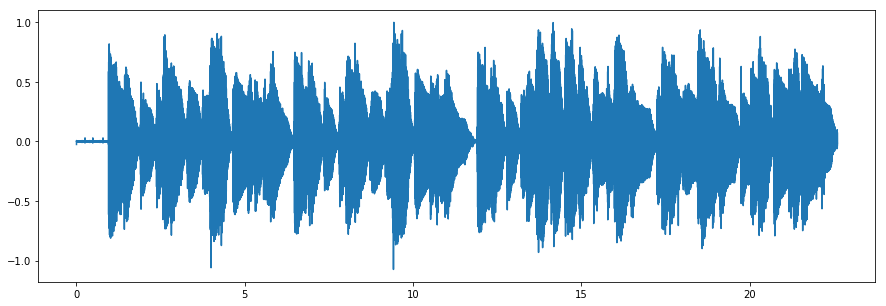

In [5]:
# I don't want to plot almost a million points, so I'm downsampling the raw waveform
resampled = signal.resample(waveform, int(num_frames/16))
resampled = resampled / max(resampled)
plt.rcParams["figure.figsize"] =(15,5)

x = np.linspace(0, duration, len(resampled))
plt.plot(x, resampled)
#ipd.Audio("audio/pirates.wav")

And that's our raw material, a homemade recording with a little noise, let's now break it down into smaller windows

In [6]:
# I've chosen a window size of 1024 samples
window_size = 1024
windows = np.array([waveform[frame:frame + window_size] for frame in
        range(1, num_frames, window_size) if
        frame + window_size < num_frames])

windows.shape

(973, 1024)

Now the audio file is split into 963 frames with 1024 samples each, let's look at an example

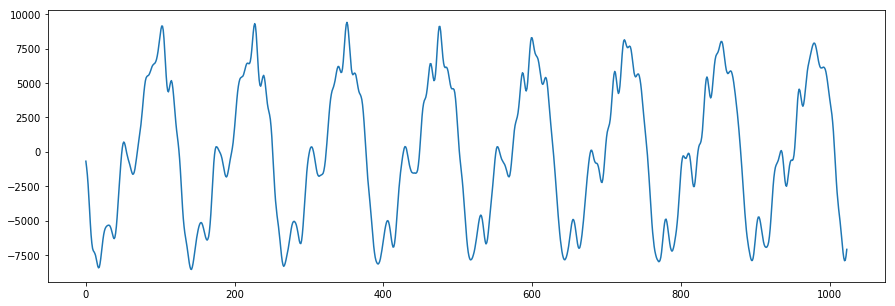

In [7]:
plt.plot(windows[150])

here we can see the periodic shape of the sound wave

From every window we can calculate, for instance, its energy

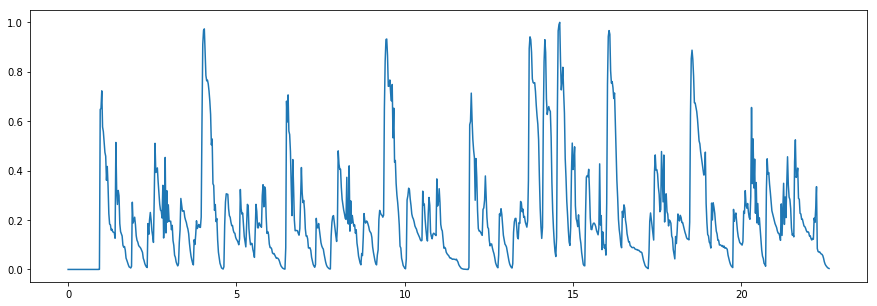

In [8]:
energy = np.array([np.sum(window ** 2) for window in windows])
energy = energy / max(energy)
x = np.linspace(0, duration, len(energy))
plt.plot(x, energy)

And also the magnitude spectogram

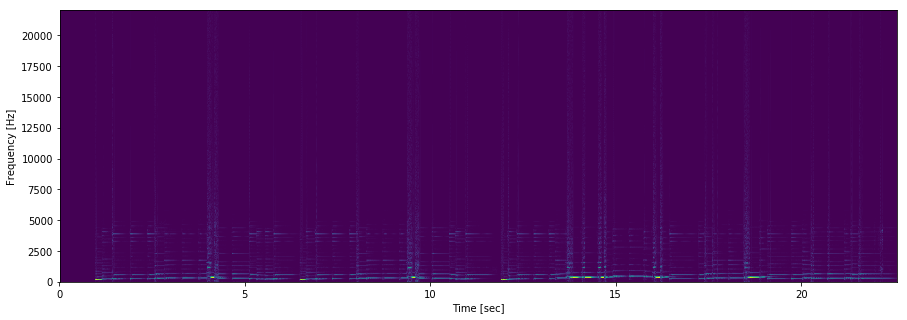

In [9]:
spec_frequency_axis, spec_time_axis, spectogram = signal.spectrogram(waveform, sampling_rate, window=signal.hann(window_size),
                                      nperseg=window_size, mode='magnitude', noverlap=0.0)

plt.pcolormesh(spec_time_axis, spec_frequency_axis, spectogram)
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')

spectogram = np.transpose(spectogram)

## 2. Onset Detection

A critical part of music trancription is identifying the starting points of each note.

Onset detection is used in many other signal processing applications and several techniques have been proposed.
Some use the energy values at the time domain, others use the frequency spectrum, others use probabilistic modeling or even hybrid approaches.

The process usually consists of using a function to highlight the peaks where the onsets candidates occur and then use a peak picking algorithm to select the useful peaks.
Refer to [1]

Let's look at the energy difference algorithm for example

### Energy Difference

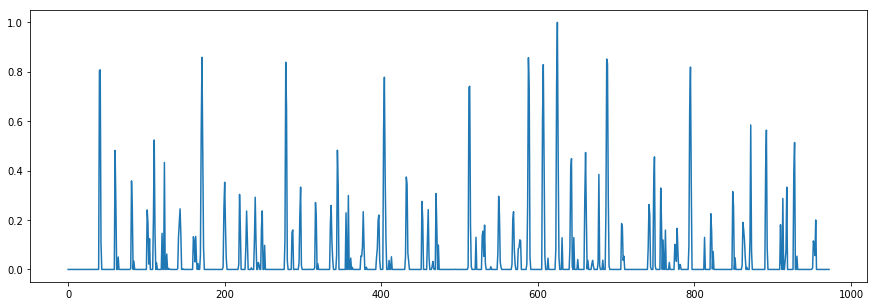

In [10]:
# gets the variation of energy
energy_diff = np.gradient(energy)

# discards negative variations for onset detection, since we are interested in the increase of energy
energy_diff = np.array([0 if x < 0 else x for x in energy_diff])

# takes the logarithm to reduce the range and bring the outliers closer to the other points
energy_diff = np.log(energy_diff + 1)

# normalizes derivative
energy_diff = energy_diff / max(energy_diff)

plt.plot(energy_diff)

This can be very effective with percursive instruments, where the start of each note is characterized by a sharp increase in energy

Other algorithms are:
- Hight Frequency Content (HFC) [2], that highlights the presence of high frequency sin waves in the spectrum near the onsets
- Spectral flux, that also operates on the frequecy domain and looks at the increase of magnitue in each frequency bin between the frames
- Superflux [3], a variation of spectral flux that uses spectral log filtering and trajectory tracking

### HFC

In [11]:
# disregard lower audible frequencies that might have high values and distort the hfc
min_index = np.searchsorted(spec_frequency_axis, [2000])[0]


# calculates the HFC
hfc_array = np.array([np.sum(np.abs(window[min_index:]) * np.arange(min_index, len(window))) for window in
                      spectogram])

# gets the variation of HFC
hfc = np.gradient(hfc_array)

# discards negative variations for onset detection, since we are interested in the increase of energy
hfc = np.array([0 if x < 0 else x for x in hfc])

# normalizes gradient
hfc = hfc / max(hfc)

### Spectral Flux

In [12]:
previous = None
flux = []
for spectrum in spectogram:
    if previous is None:
        flux.append(0)
    else:
        flux.append(np.sum(((spectrum - previous) + abs(spectrum - previous)) / 2))

    previous = spectrum

flux = np.array(flux / max(flux))

### Superflux
This is a simplified version of Böck and Widmer's work [3] and is the default algorithm used in this project

In [13]:
max_spectrogram = np.copy(spectogram)

# Log filters the spectrogram
for frame_index, frame in enumerate(spectogram):
    for bin_index, bin in enumerate(frame):
        spectogram[frame_index, bin_index] = math.log10(bin + 1)

# Gets trajectory tracking
for frame_index, frame in enumerate(spectogram):
    for bin_index, bin in enumerate(frame):
        if (0 < frame_index < len(spectogram) - 1) and (0 < bin_index < len(frame)):
            max_spectrogram[frame_index, bin_index] = max(spectogram[frame_index - 1, bin_index],
                                                          spectogram[frame_index, bin_index],
                                                          spectogram[frame_index + 1, bin_index])
        else:
            max_spectrogram[frame_index, bin_index] = bin

# Calculates the spectral flux with lag of u = 2
super_flux = []
u = 2
for frame_index, frame in enumerate(spectogram):
    if u <= frame_index < len(spectogram) - u:
        super_flux.append(np.sum(((spectogram[frame_index] - spectogram[frame_index - u]) + abs(
            spectogram[frame_index] - spectogram[frame_index - u])) / 2))
    else:
        super_flux.append(0)

super_flux = np.array(super_flux / max(super_flux))

### Comparison

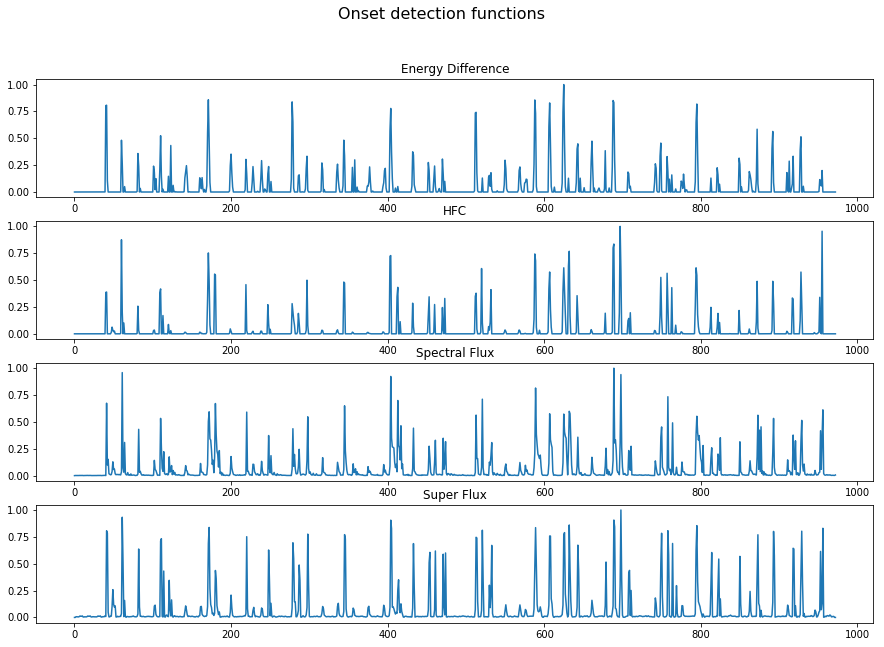

In [14]:
plt.rcParams["figure.figsize"] =(15,10)
fig = plt.figure()
fig.suptitle("Onset detection functions", fontsize=16)
ax = plt.subplot("411")
ax.set_title("Energy Difference")
ax.plot(energy_diff)

ax = plt.subplot("412")
ax.set_title("HFC")
ax.plot(hfc)

ax = plt.subplot("413")
ax.set_title("Spectral Flux")
ax.plot(flux)

ax = plt.subplot("414")
ax.set_title("Super Flux")
ax.plot(super_flux)

plt.show()

### Peak Picking
Next step is to extract the actual peaks from the onset detection function, from now on we will use the supeflux algorithm

The idea in this strategy of peak picking is to apply a rolling mean window and shift it by a threshold

Every peak above that threshold is considered an onset, as long as the previous detected onset is not too close, to avoid double picking

[41, 49, 61, 82, 103, 111, 121, 142, 162, 172, 180, 200, 220, 229, 239, 248, 279, 287, 298, 317, 337, 345, 356, 376, 395, 404, 414, 433, 454, 461, 471, 513, 521, 530, 551, 569, 576, 589, 607, 626, 632, 643, 661, 679, 689, 698, 709, 742, 750, 758, 764, 776, 795, 814, 823, 850, 863, 873, 893, 911, 918, 929, 946, 953]


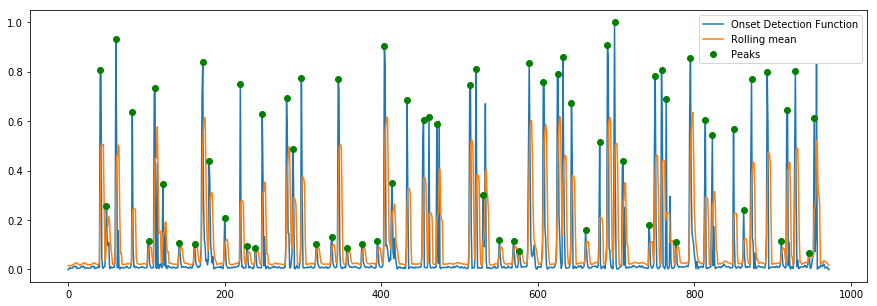

In [15]:
odf = super_flux
rolling_window_size = 5
minimum_distance = 5

# Apply a mean rolling window and adds threshold
mean = pd.Series(odf).rolling(window=rolling_window_size).mean() * 1.5 + 0.01

# Adjust the first values with indexes smaller than the rolling window size
mean[:rolling_window_size-1] = mean[rolling_window_size - 1]

# Find the peaks with the filters
peaks = []
last_index = None
for index, value in enumerate(odf):
    if 0 < index < len(odf) - 1:
        if odf[index - 1] < odf[index] > odf[index + 1] and odf[index] > mean[index]:
            if last_index is None or index - last_index > minimum_distance:
                peaks.append(index)
                last_index = index

plt.rcParams["figure.figsize"] =(15,5)
plt.plot(odf, label="Onset Detection Function")
plt.plot(mean, label="Rolling mean")
plt.plot(peaks, odf[peaks], 'go', label="Peaks")
plt.legend()
print(peaks)

Let's compare these onset times with the raw waveform

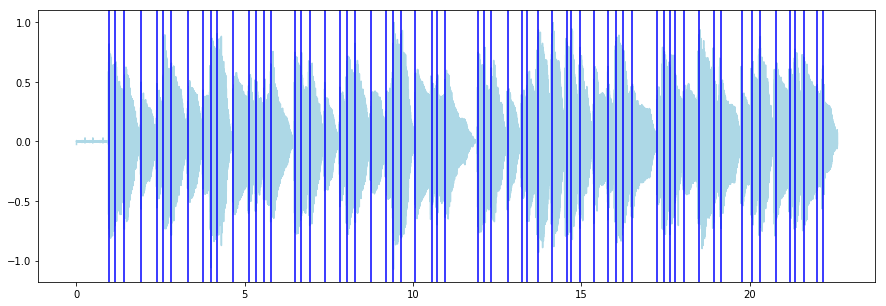

In [16]:
x = np.linspace(0, duration, len(resampled))
plt.plot(x, resampled, color="lightblue")

x = np.linspace(0, duration, len(odf))
for xc in peaks:
    plt.axvline(x[xc], color="blue")

## 3. Pitch Detection

Now we know where the notes start, the next step is to find their fundamental frequency, meaning how high or low the sound is.

As with Onset detection, several pitch detection algorithms have been proposed, examples are:
- Autocorrelation
- Cepstrum
- Robust Epoch and Pitch EstimatoR (REAPER) owned by [google](https://github.com/google/REAPER)

The pitch is basically how frequently the sound waves repeat themselves, let's look again at a sample window

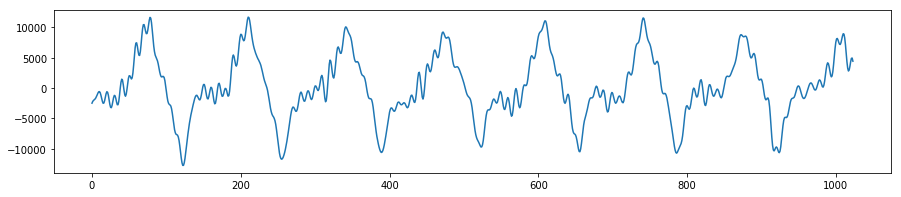

In [17]:
plt.rcParams["figure.figsize"] =(15,3)
plt.plot(windows[120])

### Autocorrelation

If we can find the wavelenght we can easily calculate the frequency, a simplistic approach for that is to use an autocorrelation function [4]

This indicates how well the signal correlates to itself when shifted by a period P, and has its peaks value when shifted exactly by multiples of a wavelenght.

It can be calculated by numpy correlate function

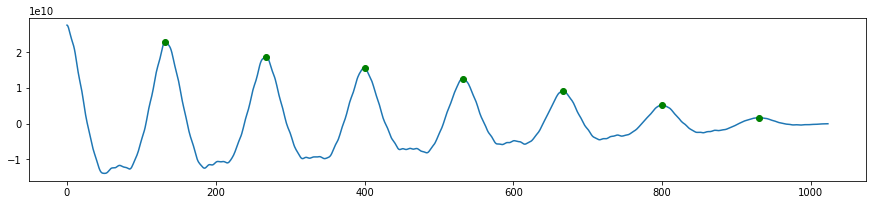

In [18]:
corr = np.correlate(windows[120], windows[120], 'full')
corr = corr[int(corr.size / 2):]
# here I used find_peaks function from scipy, since I don't need to tune thresholds
autocorr_peaks, _ = signal.find_peaks(corr, height=0)
plt.plot(corr)
plt.plot(autocorr_peaks, corr[autocorr_peaks], 'go')

So if we take the index of the first peak P we can calculate the frequency, with is simply sampling_rate / P

Let's do that with all windows

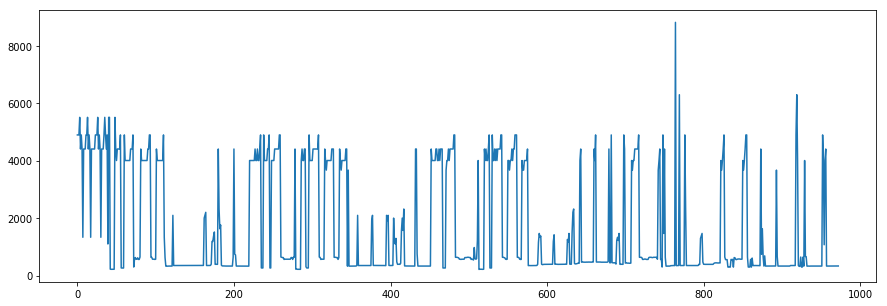

In [37]:
autocorr_list = [np.correlate(window, window, 'full') for window in windows]

f0_autocorr = np.zeros(len(autocorr_list))

for index, corr in enumerate(autocorr_list):
    autocorr_peaks, _ = signal.find_peaks(corr[int(corr.size / 2):], height=0)
    f0_autocorr[index] = sampling_rate / autocorr_peaks[0]

plt.rcParams["figure.figsize"] =(15,5)
plt.plot(f0_autocorr)

Ok, that's something, but here we see a lot of very high fundamental frequencies, mainly in the parts of silence and during onsets.

It's a good idea to filter out this frequencies, since they don't represent the music notes, and also apply a median filter to remove small irregularities


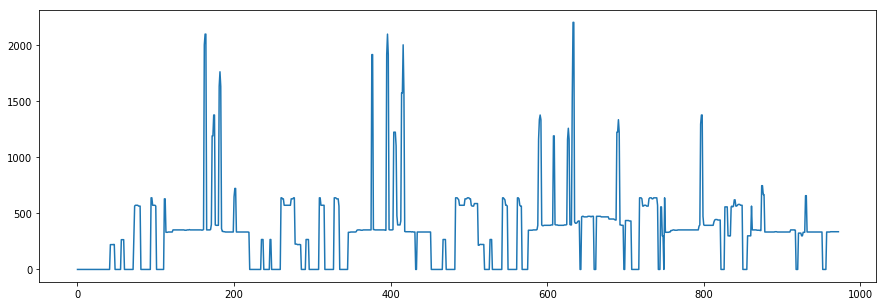

In [20]:
# high frequency filter
f0_autocorr = [0 if f0 > 3000 else f0 for f0 in f0_autocorr]

# median filter
f0_autocorr = signal.medfilt(f0_autocorr, 3)
plt.plot(f0_autocorr)

That's a little better, but still a simplistic approach

The default algorithm for pitch detection used in this project was the REAPER algorithm implemented in the [pyreaper](https://pypi.org/project/pyreaper/) module, which despite being more computationally expensive, gave much better results.

### REAPER

In [21]:
import pyreaper
waveform = waveform / max(waveform)
intWaveForm = np.ndarray.flatten(waveform * 32000).astype('int16')
pm_times, pm, f0_times, f0_reaper, corr = pyreaper.reaper(intWaveForm, sampling_rate)

# median filter
f0_reaper = signal.medfilt(f0_reaper, 3)

### Comparing both Pitch detection algorithms

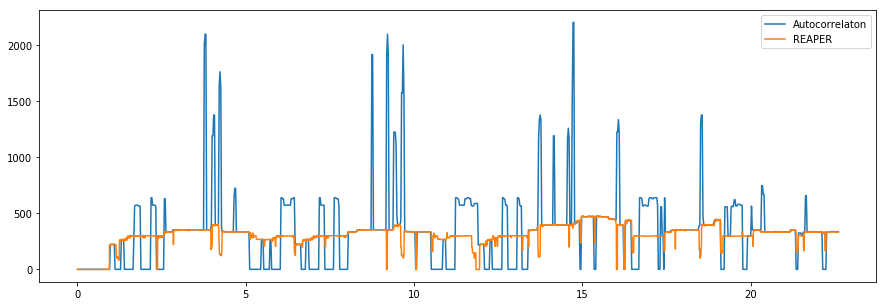

In [22]:
x = np.linspace(0, duration, len(f0_autocorr))
plt.plot(x, f0_autocorr, label="Autocorrelaton")
x = np.linspace(0, duration, len(f0_reaper))
plt.plot(x, f0_reaper, label="REAPER")
plt.legend()

Now we can use the onset information to filter out the pitch frequencies

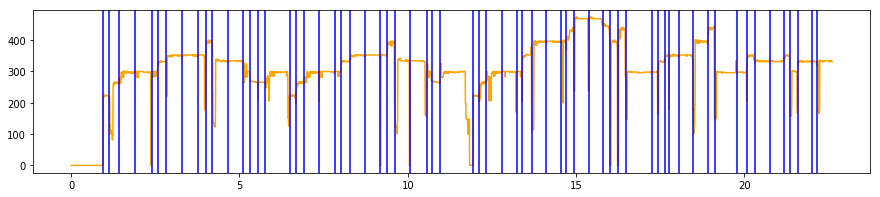

In [23]:
plt.rcParams["figure.figsize"] =(15,3)
x = np.linspace(0, duration, len(f0_reaper))
plt.plot(x, f0_reaper, color="orange")

x = np.linspace(0, duration, len(odf))
for xc in peaks:
    plt.axvline(x[xc], color="blue")

We consider the median detected frequency between each pair of onsets while also ignoring the borders, where the pitches are less stable

In [24]:
def window_to_sec(index, duration, array):
    return duration * index / len(array)

def get_median(array, border_percent=0.10):
    return np.median(array[int(len(array) * border_percent): int(len(array) * (1 - border_percent))])

pitch_array = f0_reaper
onset_array = (np.array(peaks) * (len(windows) / len(odf) * window_size) / sampling_rate)
current_note_pitch = []
current_onset_index = -1
filtered_pitch = np.array([])
note_index = 1
notes = pd.DataFrame(columns=['f0', 'duration_seconds'], index=['note_index'])

for i in np.arange(0, len(pitch_array)):
    current_note_pitch.append(pitch_array[i])
    current_time = window_to_sec(i, duration, pitch_array)

    if current_onset_index + 1 < len(onset_array) and current_time > onset_array[current_onset_index + 1]:
        median = get_median(current_note_pitch)
        curr_array = np.repeat(median, len(current_note_pitch))
        filtered_pitch = np.concatenate((filtered_pitch, curr_array))
        
        # Saves the note fundamental frequency and duration in a dataframe
        notes = notes.append(pd.DataFrame({'f0': median, 'duration_seconds': window_to_sec(len(current_note_pitch), duration, pitch_array)},
                                          index=[note_index]))

        note_index = note_index + 1
        current_note_pitch = []
        current_onset_index = current_onset_index + 1

curr_array = np.repeat(np.median(current_note_pitch), len(current_note_pitch))
filtered_pitch = np.concatenate((filtered_pitch, curr_array))
f0_list = filtered_pitch
notes = notes.append(pd.DataFrame({'f0': median, 'duration_seconds': window_to_sec(len(current_note_pitch), duration, pitch_array)},
                                  index=[note_index]))
notes = notes.dropna()

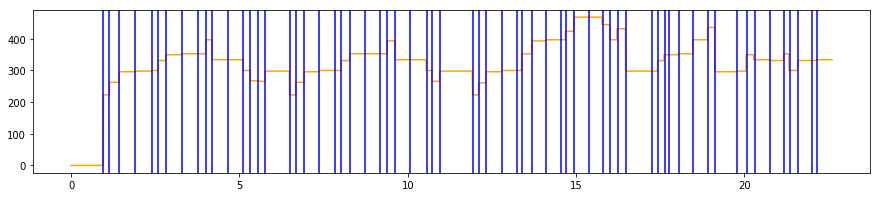

In [25]:
plt.rcParams["figure.figsize"] =(15,3)
x = np.linspace(0, duration, len(filtered_pitch))
plt.plot(x, filtered_pitch, color="orange")

x = np.linspace(0, duration, len(odf))
for xc in peaks:
    plt.axvline(x[xc], color="blue")

Now we have a single frequency per note and the notes durations in a dataframe

In [26]:
notes.head(10)

,duration_seconds,f0
1,0.960834,-1.000000
2,0.185161,222.727280
3,0.280243,262.500000
4,0.485421,295.973145
5,0.485421,297.972961
6,0.190165,300.000000
7,0.230200,331.578949
8,0.485421,350.000000
9,0.465404,352.799988
10,0.235204,352.799988


## 4. Tempo Estimation

A very important feature for music composition is the Tempo, which can be measured by Beats Per Minute (BPM)

The algorithm used in this project to estimate the BPM of the song was a simple version of the algorithm described by Tzanetakis and Percival [5]

The main ideia is to split the result of the onset detection function into smaller windows and run an autocorrelation function on each of them to get a sense of how the onsets are regularly spaced.

The values of the autocorrelation are then quantized and mapped to a beat histogram

136.0

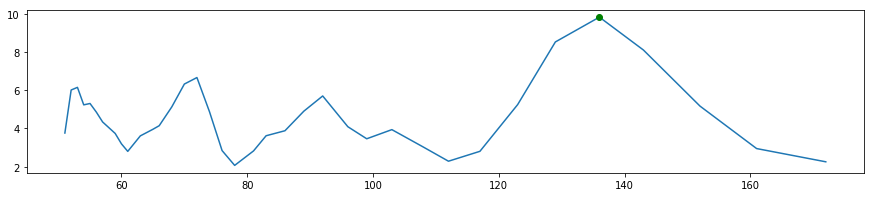

In [27]:
def quantize(x, precision=2, base=.05):
    return round(base * round(float(x) / base), precision)

tempo_window_size = 512
sample_count = len(odf)
onset_sample_rate = sample_count / duration
window_count = math.ceil(sample_count / tempo_window_size)

# append zeros
oss = np.concatenate((odf, np.zeros(int(window_count * tempo_window_size - sample_count))))

# separate windows
oss = oss.reshape(math.ceil(sample_count / tempo_window_size), tempo_window_size)

hm = pd.Series(dtype=np.dtype('float64'))
for sample in oss:
    fft_sample = sample
    corr = np.correlate(fft_sample, fft_sample, 'full')
    corr = corr[int(corr.size / 2):]

    b_hat_previous = None
    b_hat_count = 0
    am_sum = 0
    for t, am in enumerate(corr):
        if t != 0:
            b = 60 * onset_sample_rate / t
            b_hat = quantize(x=b, precision=2, base=1.0)

            if b_hat_previous is not None and b_hat != b_hat_previous:
                if b_hat_previous not in hm.keys():
                    hm.append(pd.Series([0.0], index=[b_hat_previous]))
                    hm[b_hat_previous] = 0.0

                hm[b_hat_previous] = float(hm[b_hat_previous] + am_sum / b_hat_count)
                b_hat_count = 0.0
                am_sum = 0.0

            am_sum += am
            b_hat_count += 1
            b_hat_previous = b_hat

hm = hm[(hm.index > 50) & (hm.index < 180)]
bpm = hm.idxmax()

plt.plot(hm)
plt.plot([bpm], hm[bpm], 'go')
bpm

The algorithm gives peaks on the tempo candidates.

Tzanetakis and Percival describe further steps to select the best tempo between the candidates, but I just stopped here and picked the tempo of the highest peak as it gave very good results with the audio samples I tested on

## 5. Setting Music Data

### Adding note names, accidental and octave

In [28]:
frequencyTable = [16.35, 17.32, 18.35, 19.45, 20.60, 21.83, 23.12, 24.50, 25.96, 27.50, 29.14, 30.87, 32.70,
                  34.65, 36.71, 38.89, 41.20, 43.65, 46.25, 49.00, 51.91, 55.00, 58.27, 61.74, 65.41, 69.30,
                  73.42, 77.78, 82.41, 87.31, 92.50, 98.00, 103.8, 110.0, 116.5, 123.5, 130.8, 138.6, 146.8,
                  155.6, 164.8, 174.6, 185.0, 196.0, 207.7, 220.0, 233.1, 246.9, 261.6, 277.2, 293.7, 311.1,
                  329.6, 349.2, 370.0, 392.0, 415.3, 440.0, 466.2, 493.9, 523.3, 554.4, 587.3, 622.3, 659.3,
                  698.5, 740.0, 784.0, 830.6, 880.0, 932.3, 987.8, 1047, 1109, 1175, 1245, 1319, 1397, 1480,
                  1568, 1661, 1760, 1865, 1976, 2093, 2217, 2349, 2489, 2637, 2794, 2960, 3136, 3322, 3520,
                  3729, 3951, 4186, 4435, 4699, 4978, 5274, 5588, 5920, 6272, 6645, 7040, 7459, 7902]
dict_names = {
    0: {'step': 'C', 'accidental': 'NATURAL'},
    1: {'step': 'C', 'accidental': 'SHARP'},
    2: {'step': 'D', 'accidental': 'NATURAL'},
    3: {'step': 'E', 'accidental': 'FLAT'},
    4: {'step': 'E', 'accidental': 'NATURAL'},
    5: {'step': 'F', 'accidental': 'NATURAL'},
    6: {'step': 'F', 'accidental': 'SHARP'},
    7: {'step': 'G', 'accidental': 'NATURAL'},
    8: {'step': 'G', 'accidental': 'SHARP'},
    9: {'step': 'A', 'accidental': 'NATURAL'},
    10: {'step': 'B', 'accidental': 'FLAT'},
    11: {'step': 'B', 'accidental': 'NATURAL'},
}

minimum = 100
maximum = 4000

f0_list = [
    frequencyTable[np.searchsorted(frequencyTable, int(f0))] if int(f0) in range(minimum, maximum) else 0
    for f0 in f0_list]

for index, row in notes.iterrows():
    if minimum < row.f0 < maximum:
        frequency_index = np.searchsorted(frequencyTable, int(row.f0))
        notes.at[index, 'f1'] = frequencyTable[frequency_index]
        notes.at[index, 'step'] = dict_names[frequency_index % 12]['step']
        notes.at[index, 'accidental'] = dict_names[frequency_index % 12]['accidental']
        notes.at[index, 'octave'] = int(frequency_index / 12)

    else:
        notes.at[index, 'f1'] = '0'
        notes.at[index, 'step'] = 'pause'
        notes.at[index, 'accidental'] = ''
        notes.at[index, 'octave'] = None

### Calculating Beats

Now that we have the notes durations in seconds and the music Tempo in BPM we can calculate how many beats each note take

In [29]:
# Calculates raw beats
notes['beats'] = notes['duration_seconds'] * (bpm / 60)

# Quantizes the beats in to avoid time imprecisions
notes['adjusted_beats'] = notes['beats'].apply(lambda x: quantize(x, 2, 0.25))

notes.head(10)

,duration_seconds,f0,f1,step,accidental,octave,beats,adjusted_beats
1,0.960834,-1.000000,0,pause,,NaN,2.177891,2.25
2,0.185161,222.727280,233.1,B,FLAT,3.0,0.419698,0.50
3,0.280243,262.500000,277.2,C,SHARP,4.0,0.635218,0.75
4,0.485421,295.973145,311.1,E,FLAT,4.0,1.100289,1.00
5,0.485421,297.972961,311.1,E,FLAT,4.0,1.100289,1.00
6,0.190165,300.000000,311.1,E,FLAT,4.0,0.431041,0.50
7,0.230200,331.578949,349.2,F,NATURAL,4.0,0.521786,0.50
8,0.485421,350.000000,370,F,SHARP,4.0,1.100289,1.00
9,0.465404,352.799988,370,F,SHARP,4.0,1.054916,1.00
10,0.235204,352.799988,370,F,SHARP,4.0,0.533130,0.50


### Estimating Measure Size

A music Bar or Measure is an important feature of a music sheet and is closely related to the perception of rythm for the musician

The measures have a size which indicates how many note beats it can fit, if a note cannot fit in the current measure then it should be split into more notes and connected with a tie notation

Here I estimated the measure size by selecting the value that minizes the number of connections or ties

In [30]:
# finds the measure size that minimizes the number of connected notes between measures
best_measure_size = None
best_measure_tie_count = None

for size in range(2, 6):
    tie_count = 0
    remaining_space = size
    for beat in notes['adjusted_beats']:
        current_beat = beat

        while current_beat > 0:
            if current_beat < remaining_space:
                remaining_space -= current_beat
                current_beat = 0
            elif current_beat == remaining_space:
                remaining_space = size
                current_beat = 0
            else:
                current_beat -= remaining_space
                remaining_space = size
                tie_count += 1

    if best_measure_tie_count is None or tie_count < best_measure_tie_count:
        best_measure_tie_count = tie_count
        best_measure_size = size

measure_size = best_measure_size
measure_size

4

### Fitting the notes into music figures and measures

The following functions inserts notes to the adjusted_notes dataframe, based on its beats and available note figures.

For example, a 0.75 beat note should be represented by a note figure of 0.5 beat connected to a figure of 0.25 beat.

A note of 2.75 would yield a note of 2.0, connected to a note of 0.5, connected to a note of 0.25, and so on.

In [31]:
def subdivide_note(row, beats, measure_id, start_tie=False, end_tie=False):
    subnotes = pd.DataFrame(columns=['measure_id', 'type', 'step', 'octave', 'accidental', 'is_rest',
                                            'start_tie', 'end_tie', 'duration'])
    
    figure_dict = {
        0.125: '32nd',
        0.25: '16th',
        0.5: 'eighth',
        1.0: 'quarter',
        2.0: 'half',
        4.0: 'whole'
    }
    keys = list(figure_dict.keys())

    inserted_beats = 0

    while inserted_beats < beats:
        idx = np.searchsorted(keys, beats - inserted_beats, side='left')

        if idx >= len(keys) or (idx > 0 and keys[idx] > beats):
            current_beat = keys[idx - 1]
        else:
            current_beat = keys[idx]

        if inserted_beats + current_beat < beats:
            start_tie = True

        subnotes = subnotes.append({
            'measure_id': measure_id,
            'type': figure_dict[current_beat],
            'step': row[1]['step'],
            'octave': row[1]['octave'],
            'accidental': row[1]['accidental'],
            'is_rest': True if row[1]['step'] == 'pause' else False,
            'start_tie': start_tie,
            'end_tie': end_tie,
            'duration': current_beat * 32 # Used as base for MusicXML
        }, ignore_index=True)

        inserted_beats = inserted_beats + current_beat
        if start_tie == True:
            end_tie = True
        start_tie = False
        
    return subnotes

Now that we have the measure size we try to fit the notes into measures and divide into more notes if needed

In [32]:
adjusted_notes = pd.DataFrame(columns=['measure_id', 'type', 'step', 'octave', 'accidental', 'is_rest',
                                        'start_tie', 'end_tie', 'duration'])

end_tie = False
remaining_space = measure_size
measure_id = 1
for row in notes.iterrows():
    current_beat = row[1]['adjusted_beats']

    while current_beat > 0:
        if current_beat < remaining_space:
            adjusted_notes = adjusted_notes.append(subdivide_note(row, current_beat, measure_id, end_tie=end_tie), ignore_index=True)
            remaining_space -= current_beat
            end_tie = False
            current_beat = 0
        elif current_beat == remaining_space:
            adjusted_notes = adjusted_notes.append(subdivide_note(row, current_beat, measure_id, end_tie=end_tie), ignore_index=True)
            remaining_space = measure_size
            current_beat = 0
            measure_id = measure_id + 1
        else:
            adjusted_notes = adjusted_notes.append(subdivide_note(row, remaining_space, measure_id, start_tie=True, end_tie=end_tie), ignore_index=True)
            end_tie = True
            current_beat -= remaining_space
            remaining_space = measure_size
            measure_id = measure_id + 1

In [33]:
adjusted_notes.head(10)

,measure_id,type,step,octave,accidental,is_rest,start_tie,end_tie,duration
0,1,half,pause,NaN,,True,True,False,64.0
1,1,16th,pause,NaN,,True,False,True,8.0
2,1,eighth,B,3.0,FLAT,False,False,False,16.0
3,1,eighth,C,4.0,SHARP,False,True,False,16.0
4,1,16th,C,4.0,SHARP,False,False,True,8.0
5,1,eighth,E,4.0,FLAT,False,True,False,16.0
6,2,eighth,E,4.0,FLAT,False,False,True,16.0
7,2,quarter,E,4.0,FLAT,False,False,False,32.0
8,2,eighth,E,4.0,FLAT,False,False,False,16.0
9,2,eighth,F,4.0,NATURAL,False,False,False,16.0


## Write MusicXML

From that adjusted_notes dataframe it is straightforward to write corresponding MusicXML using lxml library

In [34]:
from lxml import etree

root = etree.Element("score-partwise")
work = etree.SubElement(root, "work")
etree.SubElement(work, "work-title").text = file_name
identification = etree.SubElement(root, "identification")
encoding = etree.SubElement(identification, "encoding")
etree.SubElement(encoding, "software").text = "Monophonic Music Transcription"
defaults = etree.SubElement(root, "defaults")
scaling = etree.SubElement(defaults, "scaling")
etree.SubElement(scaling, "millimeters").text = "7.0"
etree.SubElement(scaling, "tenths").text = "40"
page_layout = etree.SubElement(defaults, "page-layout")
etree.SubElement(page_layout, "page-height").text = "1700.00"
etree.SubElement(page_layout, "page-width").text = "1190.00"
credit = etree.SubElement(root, "credit", page="1")
credit_words = etree.SubElement(credit, "credit-words", justify="center",
                                valign="top")
credit_words.text = file_name
credit_words.attrib["font-size"] = "22"
part_list = etree.SubElement(root, "part-list")
score_part = etree.SubElement(part_list, "score-part", id="P1")
etree.SubElement(score_part, "part-name").text = "Viola"
etree.SubElement(score_part, "part-abbreviation").text = "Vla."
instrument = etree.SubElement(score_part, "score-instrument", id="P1-I3")
etree.SubElement(instrument, "instrument-name").text = "Viola"
midi_instrument = etree.SubElement(score_part, "midi-instrument", id="P1-I3")
etree.SubElement(midi_instrument, "midi-channel").text = "1"
etree.SubElement(midi_instrument, "midi-program").text = "42"
etree.SubElement(midi_instrument, "volume").text = "78.7402"
etree.SubElement(midi_instrument, "pan").text = "0"

part = etree.SubElement(root, "part", id="P1")
previous_measure = 0
for row in adjusted_notes.iterrows():
    current_measure = row[1]['measure_id']
    if current_measure != previous_measure:
        measure = etree.SubElement(part, "measure", number=str(current_measure))

        # measure metadata
        if current_measure == 1:
            attributes = etree.SubElement(measure, "attributes")
            key = etree.SubElement(attributes, "key")
            etree.SubElement(key, "fifths").text = "0"
            etree.SubElement(key, "mode").text = "major"
            time = etree.SubElement(attributes, "time")
            etree.SubElement(time, "beats").text = str(int(measure_size))
            etree.SubElement(time, "beat-type").text = "4"
            clef = etree.SubElement(attributes, "clef")
            etree.SubElement(clef, "sign").text = "C"
            etree.SubElement(clef, "line").text = "3"
            etree.SubElement(measure, "sound", tempo=str(bpm))

        previous_measure = current_measure

    note = etree.SubElement(measure, "note")

    if row[1]['is_rest']:
        etree.SubElement(note, "rest")
        etree.SubElement(note, "duration").text = str(int(row[1]['duration']))
    else:
        pitch = etree.SubElement(note, "pitch")
        etree.SubElement(pitch, "step").text = str(row[1]['step'])
        if row[1]['accidental'] == 'FLAT':
            etree.SubElement(pitch, "alter").text = "-1"
        elif row[1]['accidental'] == 'SHARP':
            etree.SubElement(pitch, "alter").text = "1"

        etree.SubElement(note, "duration").text = str(row[1]['duration'])
        if row[1]['start_tie']:
            etree.SubElement(note, "tie", type="start")
        if row[1]['end_tie']:
            etree.SubElement(note, "tie", type="stop")

        etree.SubElement(pitch, "octave").text = str(int(row[1]['octave']))
        etree.SubElement(note, "voice").text = "1"

    etree.SubElement(note, "type").text = row[1]['type']

    if row[1]['start_tie'] or row[1]['end_tie']:
        notations = etree.SubElement(note, "notations")

    if row[1]['start_tie']:
        etree.SubElement(notations, "tied", type="start")

    if row[1]['end_tie']:
        etree.SubElement(notations, "tied", type="stop")

xml = etree.tostring(root, pretty_print=True, encoding='unicode',
                          doctype='<?xml version="1.0" encoding="UTF-8"?><!DOCTYPE score-partwise PUBLIC '
                                  '"-//Recordare//DTD MusicXML 3.1 Partwise//EN" '
                                  '"http://www.musicxml.org/dtds/partwise.dtd">')

output_file_name = 'musicxml/{0}.xml'.format(file_name)
with open(output_file_name, "w") as f:
    f.write(xml)
    print("musicxml saved to file " + output_file_name)

musicxml saved to file musicxml/pirates.xml


Let's print out the MusicXML content

In [35]:
from pygments import highlight
from pygments.lexers import XmlLexer
from pygments.formatters import HtmlFormatter
from IPython.core.display import HTML
import IPython

formatter = HtmlFormatter()
IPython.display.display(HTML('<style type="text/css">{}</style>{}'.format(
    formatter.get_style_defs('.highlight'),
    highlight(xml, XmlLexer(), formatter))))


## 6. Output

And that's it!

The generated MusicXML file can be opened by several music sheet editors.

My personal favorite is musescore, here is a print of the final music sheet:

In [36]:
#ipd.Audio("audio/transcripted_pirates.wav")

![alt text](musicxml/pirates_musicxml.png "Pirate")

## 7. References

###### [1] A Tutorial on Onset Detection in Music Signals.
Juan Pablo Bello, Laurent Daudet, Samer Abdallah, Chris Duxbury, Mike Davies, and Mark B. Sandler

IEEE TRANSACTIONS ON SPEECH AND AUDIO PROCESSING, VOL. 13, NO. 5, SEPTEMBER 2005

###### [2] Computer Modeling of Sound For Transformation and Synthesis of Musical Signals
Paul Masri

University of Bristol, 1996

###### [3] Maximum Filter Vibrato Suppression for Onset Detection
Sebastian Böck and Gerhard Widmer

Proc. of the 16 th Int. Conference on Digital Audio Effects (DAFx-13), Maynooth, Ireland, September 2-6, 2013

###### [4] On the Use of Autocorrelation Analysis for Pitch Detection
LAWRENCE R. RABINER, FELLOW

IEEE TRANSACTIONS ON ACOUSTICS, SPEECH, AND SIGNAL PROCESSING, VOL. ASSP-25, NO. 1, FEBRUARY 1977

###### [5] AN EFFECTIVE, SIMPLE TEMPO ESTIMATION METHOD BASED ON SELF-SIMILARITY AND REGULARITY
G. Tzanetakis, G. Percival

Department of Computer Science University of Victoria, Canada